In [117]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px

from data.io import Reader, Saver
from data.plot import Drawer
from analyzer.stat_criterion.stat_criteria import StatCriteria
from data.encoder import Encoder
from data.normalizer import Normalizer
from data import DataPreparation

from sklearn.decomposition import PCA, KernelPCA, IncrementalPCA
from sklearn.random_projection import GaussianRandomProjection
from sklearn.manifold import TSNE, MDS, Isomap, LocallyLinearEmbedding
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression, ElasticNet, BayesianRidge, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor, BaggingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

# Постановка задачи
1. Провести анализ и предсказать возраст краба

датасет:
https://raw.githubusercontent.com/Semendyeav/datasets/main/PDA110_CrabAge.csv



# Проверка целостности датасета

In [118]:
# читаем датасет в память из внешнего источника
df_original = Reader.read_csv("https://raw.githubusercontent.com/Semendyeav/datasets/main/PDA110_CrabAge.csv")
Saver.save_csv(df_original, "PDA200_practice1", False)
df = df_original.copy().reset_index(drop=True)
df.head(10)

Файл успешно сохранён: ./dataset/PDA200_practice1.csv


,sex,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
0,F,1.2875,0.9875,0.3500,19.447757,7.966209,3.557862,6.236890,12
1,I,1.0500,0.8000,0.2875,10.659412,4.791066,2.608154,2.834950,5
2,M,1.6125,1.2500,0.4375,37.945806,17.945234,8.476501,9.893975,11
3,F,1.4125,1.1250,0.4125,25.146006,10.489315,6.775531,7.059025,11
4,I,0.6000,0.4500,0.1375,1.573397,0.666213,0.368544,0.510291,4
5,M,1.5875,1.3125,0.5125,42.070658,15.592225,8.830869,12.190285,20
6,I,1.2125,0.8875,0.3000,14.415721,5.953395,3.458639,3.827183,9
7,I,1.3250,1.0000,0.3625,15.733973,5.485628,3.699610,5.528153,9
8,M,1.3625,1.0500,0.3125,27.626588,10.007373,4.932813,8.646598,13
9,M,1.1500,0.9000,0.3375,17.307370,5.542327,3.033396,6.662133,14


In [119]:
# смотрим на типы данных и требования к памяти
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3893 entries, 0 to 3892
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   sex             3893 non-null   object 
 1   length          3893 non-null   float64
 2   diameter        3893 non-null   float64
 3   height          3893 non-null   float64
 4   weight          3893 non-null   float64
 5   shucked_weight  3893 non-null   float64
 6   viscera_weight  3893 non-null   float64
 7   shell_weight    3893 non-null   float64
 8   age             3893 non-null   int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 273.9+ KB


In [120]:
# посмотрим на пропуски в данных
df.isna().sum()

sex               0
length            0
diameter          0
height            0
weight            0
shucked_weight    0
viscera_weight    0
shell_weight      0
age               0
dtype: int64

In [121]:
# Посмотрим статистику о датасете
df.describe()

,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
count,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000
mean,1.311306,1.020893,0.349374,23.567275,10.207342,5.136546,6.795844,9.954791
std,0.300431,0.248233,0.104976,13.891201,6.275275,3.104133,3.943392,3.220967
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.014175,0.042524,1.000000
25%,1.125000,0.875000,0.287500,12.672227,5.343881,2.664853,3.713785,8.000000
50%,1.362500,1.062500,0.362500,22.792998,9.539607,4.861939,6.662133,10.000000
75%,1.537500,1.200000,0.412500,32.786197,14.273973,7.200773,9.355335,11.000000
max,2.037500,1.625000,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


# Оптимизируем датасет

In [122]:
df['age'] = df['age'].astype('uint8')

In [123]:
# проверяем
df.describe()

,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
count,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000
mean,1.311306,1.020893,0.349374,23.567275,10.207342,5.136546,6.795844,9.954791
std,0.300431,0.248233,0.104976,13.891201,6.275275,3.104133,3.943392,3.220967
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.014175,0.042524,1.000000
25%,1.125000,0.875000,0.287500,12.672227,5.343881,2.664853,3.713785,8.000000
50%,1.362500,1.062500,0.362500,22.792998,9.539607,4.861939,6.662133,10.000000
75%,1.537500,1.200000,0.412500,32.786197,14.273973,7.200773,9.355335,11.000000
max,2.037500,1.625000,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3893 entries, 0 to 3892
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   sex             3893 non-null   object 
 1   length          3893 non-null   float64
 2   diameter        3893 non-null   float64
 3   height          3893 non-null   float64
 4   weight          3893 non-null   float64
 5   shucked_weight  3893 non-null   float64
 6   viscera_weight  3893 non-null   float64
 7   shell_weight    3893 non-null   float64
 8   age             3893 non-null   uint8  
dtypes: float64(7), object(1), uint8(1)
memory usage: 247.2+ KB


# Проводим первичный визуальный анализ зависимостей данных

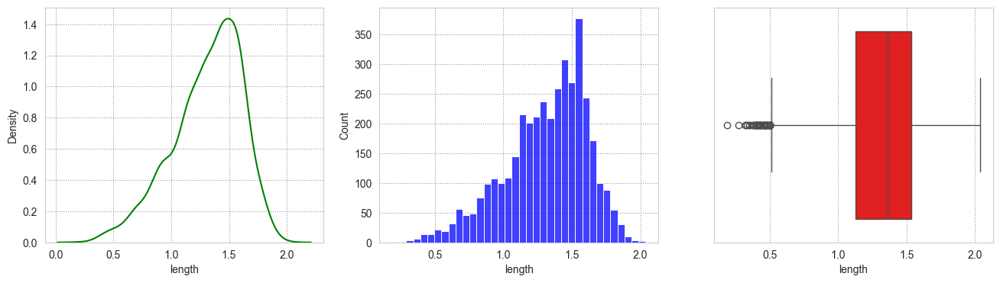

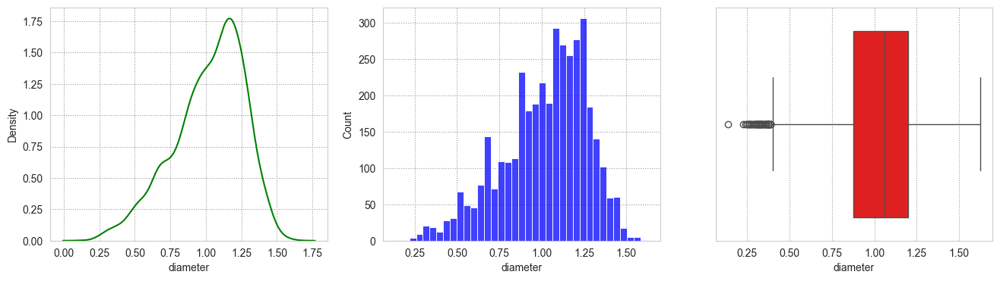

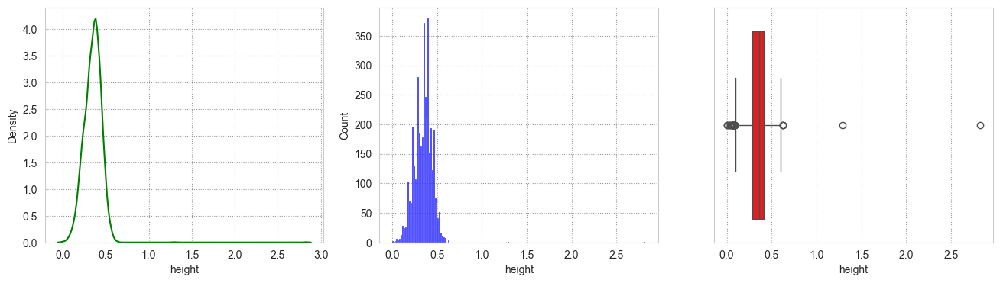

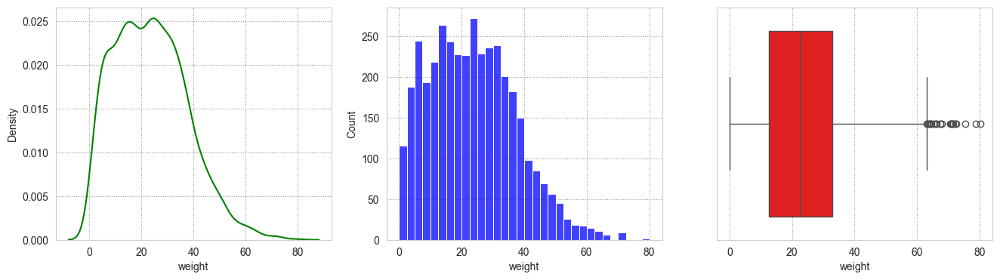

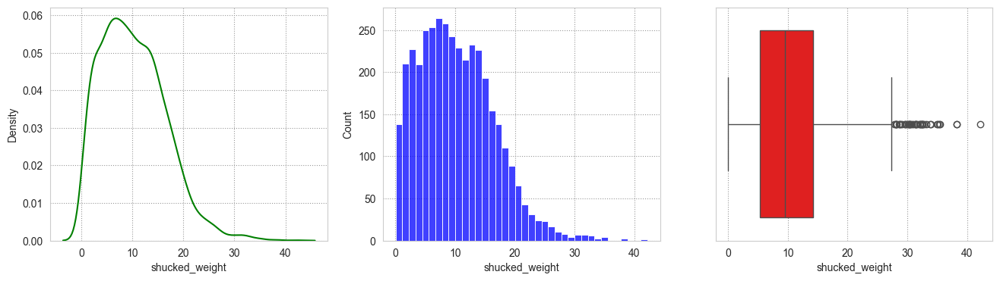

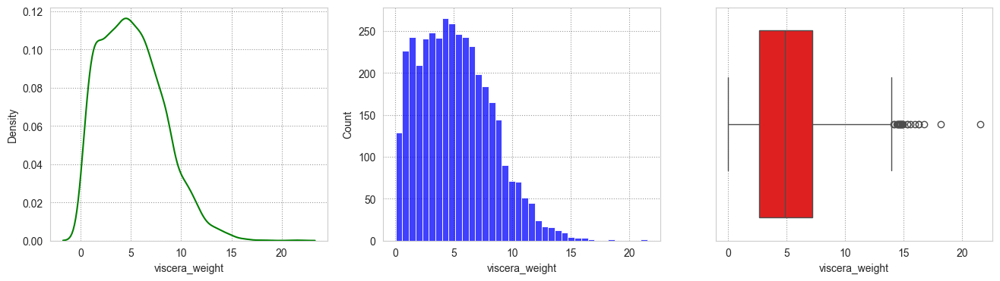

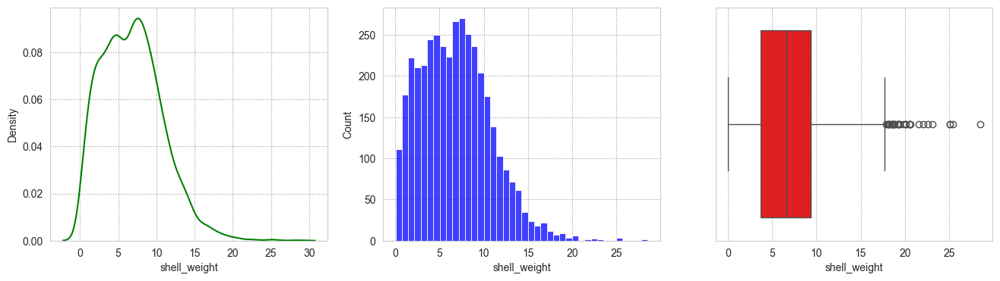

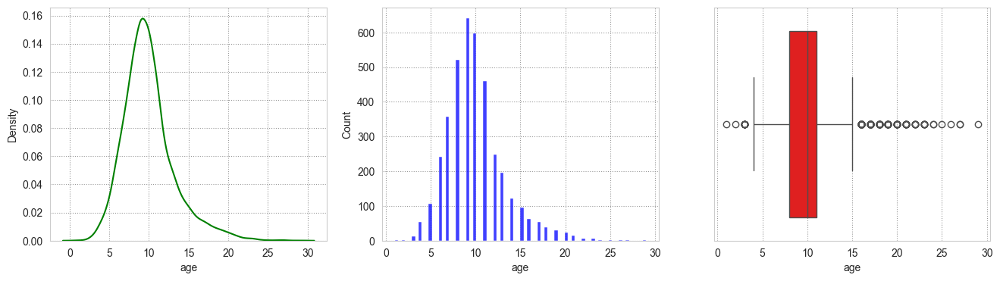

In [125]:
# Посмотрим на виды распределений "числовых" параметров и на ящики с усами
Drawer.plot_numeric_seaborn(df)

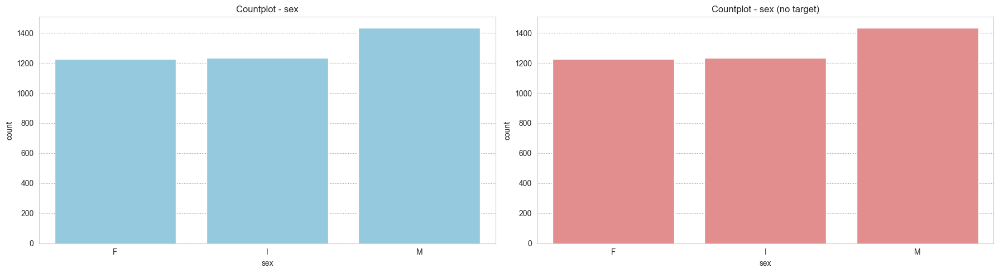

In [126]:
# Посмотрим на распределение категориальных величин
Drawer.plot_categorical_seaborn(df)

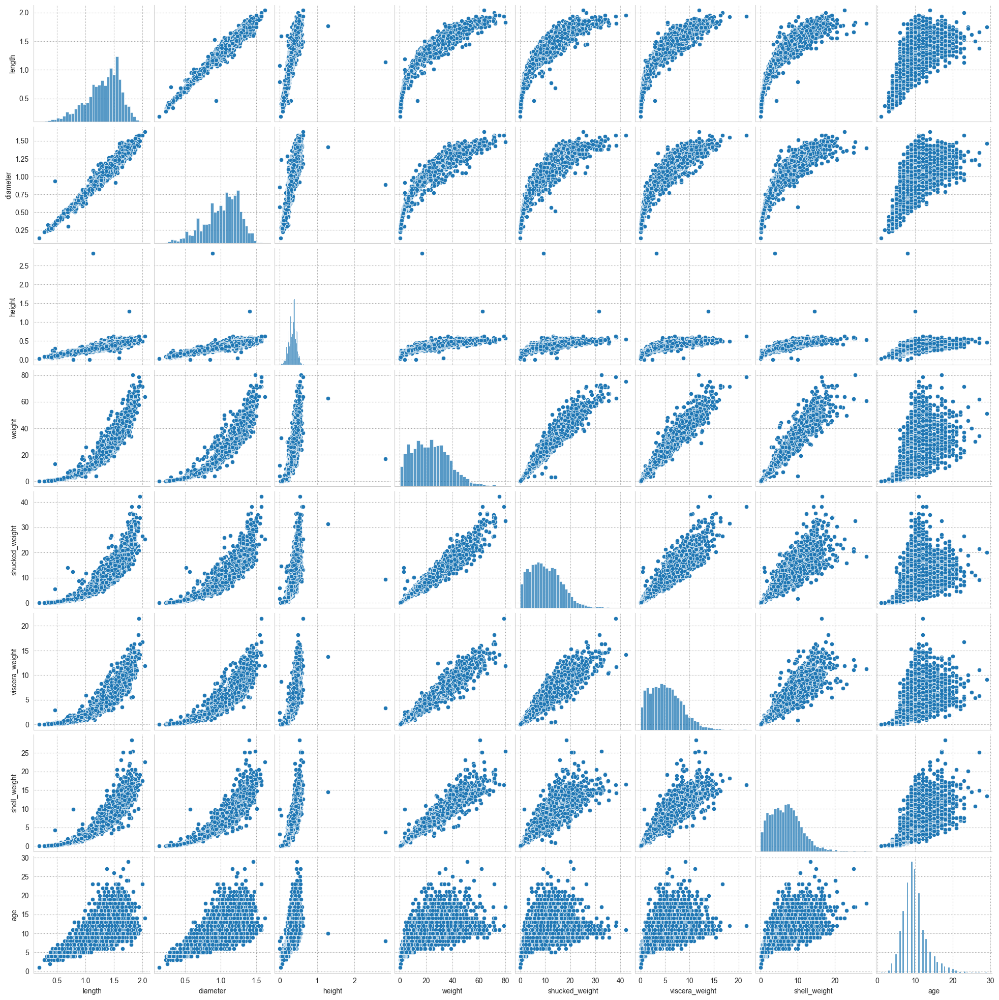

In [127]:
numeric_col = df.describe().columns
sns.pairplot(df[numeric_col])

# Проводим оценку зависимостей

## стат.обработка непрерывных данных

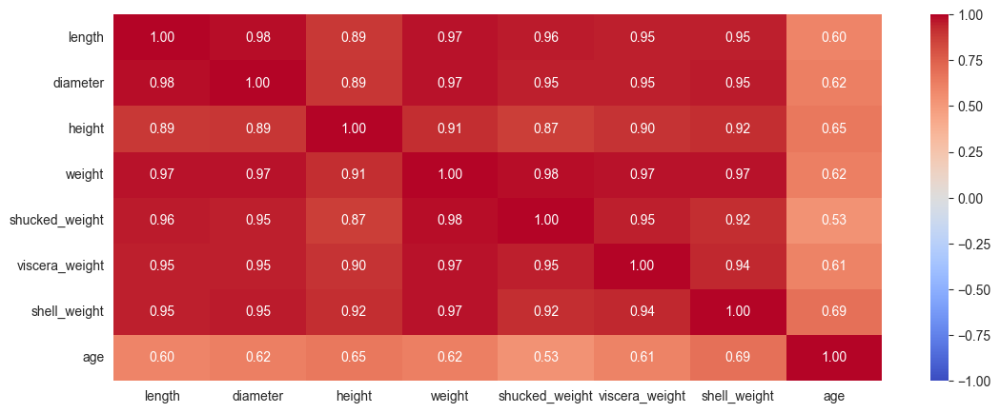

In [128]:
# Исследуем тепловую карту корреляции непрерывных признаков 
Drawer.plot_heatmap(df, method='spearman', boundary=0.5)

In [129]:
# проверяем распределения между таргетом и признаками
for column in df.select_dtypes(include='number').columns:
    print(f"\n{column} и age:")
    groups = [df[column], df['age']]
    StatCriteria().mannwhitneyu(groups)


length и age:
Mann-Whitney U test
U_statistic = 3263.500
Распределения двух выборок не равны (p-value = 0.000).

diameter и age:
Mann-Whitney U test
U_statistic = 2282.000
Распределения двух выборок не равны (p-value = 0.000).

height и age:
Mann-Whitney U test
U_statistic = 3.000
Распределения двух выборок не равны (p-value = 0.000).

weight и age:
Mann-Whitney U test
U_statistic = 12231347.000
Распределения двух выборок не равны (p-value = 0.000).

shucked_weight и age:
Mann-Whitney U test
U_statistic = 7381227.000
Распределения двух выборок не равны (p-value = 0.047).

viscera_weight и age:
Mann-Whitney U test
U_statistic = 2016158.000
Распределения двух выборок не равны (p-value = 0.000).

shell_weight и age:
Mann-Whitney U test
U_statistic = 3959715.000
Распределения двух выборок не равны (p-value = 0.000).

age и age:
Mann-Whitney U test
U_statistic = 7577724.500
Распределения двух выборок равны (p-value = 1.000).


In [130]:
# проверяем распределения между таргетом и уник зн-ями катег признаков
column_list = ['sex']
for column in column_list:
    groups = []
    for unique_value in df[column].unique():
        groups.append(df[df[column] == unique_value]['age'])
    StatCriteria().kruskal(groups)

kruskal
statistic = 1013.624
Медианы всех групп не равны (p-value = 0.000).


In [131]:
# Проверим допущение о мультиколлинеарности признаков
exclude_features = ['age']
StatCriteria().VIF(df, exclude_features)

,VIF
length,688.146252
diameter,742.886099
height,40.820789
weight,412.753667
shucked_weight,99.669938
viscera_weight,62.339241
shell_weight,81.318543


## стат.обработка категориальных данных

In [132]:
# Смотрим на колонки с категориальными переменными
df.describe(include='object')

,sex
count,3893
unique,3
top,M
freq,1435


# Подготавливаем данные

In [133]:
# разделяем данные
target = ['age']
exclude_features = ['age', 'sex']

y = df[target]
X = df.drop(exclude_features , axis=1)

# кодируем
categorical_features = df.select_dtypes(include='object').columns.tolist()
columns_for_encoding = [feature for feature in categorical_features if feature not in exclude_features]

X, _, _ = Encoder.oneHotEncoder(X, X, columns_for_encoding)
# X, _, _ = Encoder.targetEncoder(X, X, y, columns_for_encoding)

# нормализуем
X, _, _ = Normalizer().StandardScaler(X, X)
X, _, y, _ = Normalizer().reset_index(X, X, y, y)

## визуализация через t-SNE

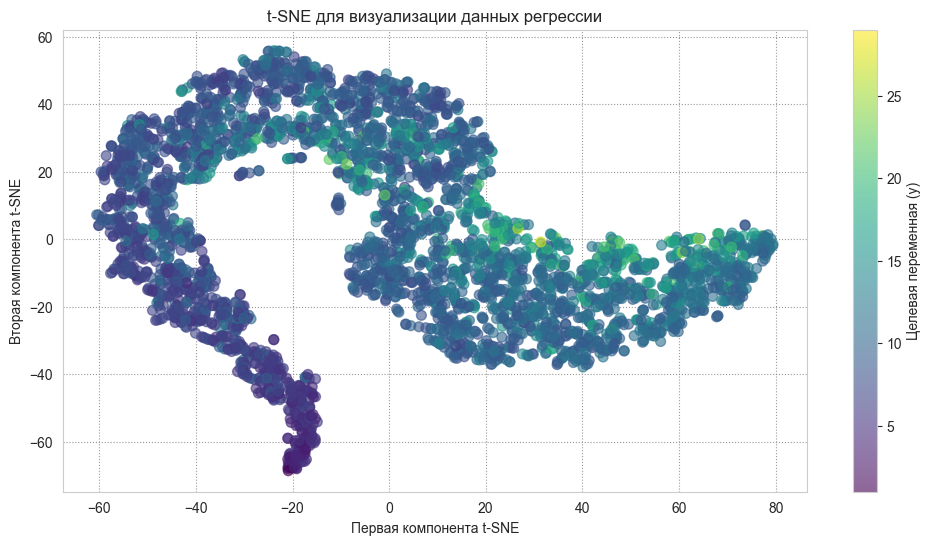

In [134]:
## визуализация через t-SNE
tsne = TSNE(n_components=2, max_iter=1_000)
X_transformed = tsne.fit_transform(X)

# Визуализируем результат
plt.figure(figsize=(12,6))
plt.scatter(X_transformed[:,0], X_transformed[:,1], c=np.array(y), cmap='viridis', s=50, alpha=0.6)
plt.colorbar(label='Целевая переменная (y)')
plt.xlabel('Первая компонента t-SNE')
plt.ylabel('Вторая компонента t-SNE')
plt.title('t-SNE для визуализации данных регрессии')
plt.show()

In [135]:
tsne = TSNE(n_components=3, max_iter=1_000)
X_transformed = tsne.fit_transform(X)

# Создаем DataFrame для визуализации
_df = pd.DataFrame(X_transformed, columns=['Component 1', 'Component 2', 'Component 3'])
_df['age'] = y

# Строим 3D scatter plot
fig = px.scatter_3d(_df, 
                    x='Component 1', 
                    y='Component 2', 
                    z='Component 3', 
                    color='age',
                    title='3D t-SNE для визуализации данных регрессии')

fig.show()

## визуализация через MDS

In [136]:
# mds = MDS(n_components=3, random_state=42)
# X_transformed = mds.fit_transform(X)
# 
# # Создаем DataFrame для визуализации
# _df = pd.DataFrame(X_transformed, columns=['Component 1', 'Component 2', 'Component 3'])
# _df['age'] = y
# 
# # Строим 3D scatter plot
# fig = px.scatter_3d(_df, 
#                     x='Component 1', 
#                     y='Component 2', 
#                     z='Component 3', 
#                     color='age',
#                     title='3D MDS для визуализации данных регрессии')
# fig.show()

## визуализация через Isomap

In [137]:
isomap = Isomap(n_components=3, n_neighbors=5)
X_transformed = isomap.fit_transform(X)

# Создаем DataFrame для визуализации
_df = pd.DataFrame(X_transformed, columns=['Component 1', 'Component 2', 'Component 3'])
_df['age'] = y

# Строим 3D scatter plot
fig = px.scatter_3d(_df, 
                    x='Component 1', 
                    y='Component 2', 
                    z='Component 3', 
                    color='age',
                    title='3D Isomap для визуализации данных регрессии')
fig.show()

## визуализация через LLE

In [138]:
LLE = LocallyLinearEmbedding(n_components=3, n_neighbors=5, random_state=42)
X_transformed = LLE.fit_transform(X)

# Создаем DataFrame для визуализации
_df = pd.DataFrame(X_transformed, columns=['Component 1', 'Component 2', 'Component 3'])
_df['age'] = y

# Строим 3D scatter plot
fig = px.scatter_3d(_df, 
                    x='Component 1', 
                    y='Component 2', 
                    z='Component 3', 
                    color='age',
                    title='3D LLE для визуализации данных регрессии')
fig.show()

Вывод:
включением признака sex в анализ, говорит о невозможности кластеризовать данные по этому признаку

## делим датасет для обучения моделей

In [143]:
# разделяем данные
target = ['age']
exclude_features = ['age', 'sex']

X_train, X_test, y_train, y_test = DataPreparation().train_test_split(df, exclude_features, target)

# кодируем
categorical_features = df.select_dtypes(include='object').columns.tolist()
columns_for_encoding = [feature for feature in categorical_features if feature not in exclude_features]

X_train, X_test, _ = Encoder.oneHotEncoder(X_train, X_test, columns_for_encoding)

# нормализуем
X_train, X_test, _ = Normalizer().StandardScaler(X_train, X_test)
X_train, X_test, y_train, y_test = Normalizer().reset_index(X_train, X_test, y_train, y_test)

# Находим модель

## перебор моделей с различными трансформациями

In [147]:
transformers = {
    'PCA': PCA(),
    'KernelPCA': KernelPCA(n_components=2, kernel='rbf'),
    'RandomizedPCA': PCA(svd_solver='randomized', random_state=42),
    'IncrementalPCA': IncrementalPCA(batch_size=100),
    'GaussianRandomProjection': GaussianRandomProjection(n_components=2, random_state=42)
}

In [148]:
# проверяем несколько моделей
models = {
    'LinearRegression': LinearRegression(),
    'ElasticNet': ElasticNet(),
    'BayesianRidge': BayesianRidge(),
    'SGDRegressor': SGDRegressor(),
    'KNeighborsRegressor': KNeighborsRegressor(),
    'SVR': SVR(),
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'RandomForestRegressor': RandomForestRegressor(),
    'ExtraTreesRegressor': ExtraTreesRegressor(),
    'AdaBoostRegressor': AdaBoostRegressor(),
    'GradientBoostingRegressor': GradientBoostingRegressor(),
    'XGBoost': XGBRegressor(),
    'CatBoost': CatBoostRegressor(allow_writing_files=False, silent=True),
    'BaggingRegressor': BaggingRegressor()
}

In [149]:
results = []
for key_transformer, transformer in transformers.items():
    print(f"\nТРАНСФОРМАЦИЯ {key_transformer}:")
    X_train_transformed = pd.DataFrame(transformer.fit_transform(X_train))
    X_test_transformed = pd.DataFrame(transformer.transform(X_test))
    for key_model, model in models.items():
        real_score = cross_val_score(model, X_train_transformed, y_train, cv=5, n_jobs=-1, scoring='r2')
        mean_score = round(real_score.mean() * 100, 2)
        results.append({'transformer': key_transformer,
                        'model': key_model,
                        'score': mean_score
                        })
        print(f"{key_model}: {mean_score}")

# Находим максимальную метрику
if results:
    best_result = max(results, key=lambda x: x['score'])
    print(f"\nЛучший результат:")
    print(f"Трансформация: {best_result['transformer']}")
    print(f"Модель: {best_result['model']}")
    print(f"R^2: {best_result['score']}")
else:
    print("Нет результатов для анализа.")


ТРАНСФОРМАЦИЯ PCA:
LinearRegression: 53.83
ElasticNet: 32.73
BayesianRidge: 53.84
SGDRegressor: 53.28
KNeighborsRegressor: 48.11
SVR: 54.23
DecisionTreeRegressor: 14.12
RandomForestRegressor: 55.88
ExtraTreesRegressor: 55.84
AdaBoostRegressor: 32.56
GradientBoostingRegressor: 56.39
XGBoost: 50.03
CatBoost: 55.19
BaggingRegressor: 52.36

ТРАНСФОРМАЦИЯ KernelPCA:
LinearRegression: 23.37
ElasticNet: 4.24
BayesianRidge: 23.37
SGDRegressor: 23.37
KNeighborsRegressor: 29.73
SVR: 32.26
DecisionTreeRegressor: -22.35
RandomForestRegressor: 26.45
ExtraTreesRegressor: 20.68
AdaBoostRegressor: -5.74
GradientBoostingRegressor: 36.65
XGBoost: 21.0
CatBoost: 35.08
BaggingRegressor: 22.55

ТРАНСФОРМАЦИЯ RandomizedPCA:
LinearRegression: 53.83
ElasticNet: 32.73
BayesianRidge: 53.84
SGDRegressor: 53.15
KNeighborsRegressor: 48.11
SVR: 54.23
DecisionTreeRegressor: 15.44
RandomForestRegressor: 55.76
ExtraTreesRegressor: 56.49
AdaBoostRegressor: 33.79
GradientBoostingRegressor: 56.38
XGBoost: 50.03
CatBoost